In [1]:
import tensorflow as tf
import rasterio
import glob
import os
import random

import numpy as np
import numpy.ma as ma
import matplotlib.pyplot as plt

from tensorflow import keras
from tensorflow.keras.activations import softmax
from keras import backend as K
from keras.utils import to_categorical
from keras.optimizers import Adam
from tensorflow.keras.layers import Activation, Input, Dense, AveragePooling2D, Conv2D, DepthwiseConv2D
from tensorflow.keras.layers import MaxPooling2D, UpSampling2D, Conv2DTranspose, BatchNormalization, Dropout
from tensorflow.keras.layers import concatenate, Multiply, RandomFlip, RandomRotation, RandomTranslation, RandomCrop
from tensorflow.keras.layers import RandomContrast, RandomBrightness
from tensorflow.keras.models import Model
from tensorflow.keras import backend as K 
from tensorflow.keras import losses
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
from tensorflow.keras.regularizers import l1, l2
from keras.callbacks import EarlyStopping

from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

from matplotlib.colors import ListedColormap

from typing import Callable, Union

In [7]:
# Fossa paths
#Geotiff image folder, containing the trainingdata.
train_img_dir = "/tf/Koulutyöt/Gradu/data/opetus/opetus"
# Geotiff image folder, containing the labels, where different classes are labeled. Should be the same size as images
train_label_dir = "/tf/Koulutyöt/Gradu/data/opetus/opetusannotaatiot"
# Same for test images and labels
test_img_dir = "/tf/Koulutyöt/Gradu/data/opetus/testi"
test_label_dir = "/tf/Koulutyöt/Gradu/data/opetus/testausannotaatiot"

"""
#Yoga paths
#Geotiff image folder, containing the trainingdata.
train_img_dir = "/home/iiro/Documents/Koulutyöt/Gradu/data/opetus/opetus"
# Geotiff image folder, containing the labels, where different classes are labeled. Should be the same size as images
train_label_dir = "/home/iiro/Documents/Koulutyöt/Gradu/data/opetus/opetusannotaatiot"
# Same for test images and labels
test_img_dir = "/home/iiro/Documents/Koulutyöt/Gradu/data/opetus/testi"
test_label_dir = "/home/iiro/Documents/Koulutyöt/Gradu/data/opetus/testausannotaatiot"
"""
# A good value for the used dataset, may change depending on the data
uncertainty_coefficient = 0.5
treshold = 0.0
#num_classes = 4
plt.rcParams['figure.dpi'] = 200

img_width = 288
band_count=3

def img_loader(image_dir):
    """ Fetches all the tiffs in the given directory and creates a numpy ndarray of shape (image_count, bands, width, height) from them.
    Returns the array, tiff metadata as list and associated nodatamasks in shape (image_count, width, height)
    Tiffs are assumed to be same size and named {number}.tif starting from 0
    """
    # fetching the filepaths
    paths = []
    metas = []
    for path in glob.glob(os.path.join(image_dir, "*.tif")):
        paths.append(path)
       
    img_count = len(paths)

    # Getting the size of the images
    with rasterio.open(paths[0]) as src:
        meta = src.meta.copy()
    image_width = meta['width']
    image_height = meta['height']
    # Required for the network
    
    nodata_masks = np.empty((img_count, image_width, image_height), dtype='bool')     
    for i in range(img_count):
        path = os.path.join(image_dir, str(i) + ".tif")
        with rasterio.open(path) as src:
            meta = src.meta.copy()
            meta['dtype'] = 'float32'
            metas.append(meta)
            # Note: rasterio returns shape (bands, width, height)
            img_arr = np.empty((meta['count'], image_width, image_height,), dtype='float32')
            
            # Normalizing the data between 0 and 1. Differing bands have different values so they are processed separately
            # Rasterio follows GDAL convention and starts band numbering from 1
            for band_n in range(1, meta['count'] + 1):
                """There might be slight differences in the nodatamasks between the bands, they are all ANDed together
                to create a mask that covers all the nodata patches in all bands.
                Therefore nodata processing needs to be inside this loop
                """
                nodata_mask = src.read_masks(band_n)
                
                """Changing the mask to reflect numpy convention instead of gdal.
                Invalid entries have a value of 1 or True, and valid have values of 0 or False. 
                """
                nodata_mask = nodata_mask == 0
                if band_n == 1: 
                    nodata_mask_full = nodata_mask
                else:
                    nodata_mask_full = np.logical_and(nodata_mask_full, nodata_mask, out=nodata_mask_full)

                #normalization
                band_arr = src.read(band_n)
                band_arr = band_arr.astype('float32')
                # Setting nodatamasks to zero
                band_arr[band_arr == meta['nodata']] = 0
                #band_arr_masked = ma.masked_array(band_arr, mask=nodata_mask)
                # Disabled because the images are rgb
                #minimum = band_arr.min()
                #maximum = band_arr.max()
                maximum = 255
                minimum = 0
                # Prevents dividing with zero if all the values are 0
                #if maximum > 0:
                band_arr = (band_arr - minimum)/ (maximum-minimum)
                
                img_arr[band_n-1] = band_arr
                
                
        nodata_masks[i] = nodata_mask_full
        # Storing array needs to be created only on the first iteration. 
        # All images are assumed to be same size and dtype, so the meta of the first one is used
        if i==0:
            data_arr = np.empty((img_count, meta['count'], meta['width'], meta['height']), dtype=meta['dtype'])
        data_arr[i] = img_arr
      
    data_arr = np.moveaxis(data_arr, 1, -1)
    return data_arr, metas, nodata_masks

def label_loader(label_dir):
    """Fetches all the tiffs in the given directory and return a numpy ndarray of shape (image_count, width, height).
    The images are assumed to be same size and contain the labels with numbers showing classes. 
    The tiffs should have only one band,
    """
    # fetching the filepaths
    paths = []
    for path in glob.glob(os.path.join(label_dir, "*.tif")):
        paths.append(path)
       
    img_count = len(paths)
    
    # Getting the size of the images
    with rasterio.open(paths[0]) as src:
        meta = src.meta.copy()
    nodata_value = meta['nodata']
    data_arr = np.empty((img_count, meta['count'], meta['width'], meta['height']), dtype='uint8')
    
    for i in range(img_count):
        path = os.path.join(label_dir, str(i) + ".tif")
        with rasterio.open(path) as src:
            img_arr = src.read(1)
        #TODO add nodata handling. It could be a good idea to add 1 to the values and set the nodata pixel value as 0  
        # Or maybe nodata as zeros is just fine
        #img_arr[img_arr == 255] = 0
        # moving band count(1) to last place
        img_arr = img_arr.astype('uint8')  
        data_arr[i] = img_arr
    data_arr = np.moveaxis(data_arr, 1, -1)
    return data_arr, nodata_value

def image_label_to_categorical(image_labels, class_count, drop_background=True):
    """ Takes in integer image with each class having one value.
    Background is assumed to be zeros and is dropped off by default
    """
    # Internally 0 is considered a class
    class_count += 1
    batch_size, n_rows, n_columns, bands = image_labels.shape
    label_vector = image_labels.ravel()
    categorical_vector = to_categorical(label_vector)
    categorical_image_labels = categorical_vector.reshape([batch_size, n_rows, n_columns, class_count])
    # The background (values of 0)is assigned to be a class but we dont actually need that so it is dropped
    if drop_background:
        categorical_image_labels = categorical_image_labels[:,:,:,1 :class_count + 1]
    return categorical_image_labels

def SepConv_BN(x, filters, stride=1, kernel_size=3, rate=1, depth_activation=False, epsilon=1e-3):
    """ SepConv with BN between depthwise & pointwise. Optionally add activation after BN
        Implements right "same" padding for even kernel sizes
        Args:
            x: input tensor
            filters: num of filters in pointwise convolution
            prefix: prefix before name
            stride: stride at depthwise conv
            kernel_size: kernel size for depthwise convolution
            rate: atrous rate for depthwise convolution
            depth_activation: flag to use activation between depthwise & poinwise convs
            epsilon: epsilon to use in BN layer
            the code is based on keras implementation of deeplabV3+ https://github.com/bonlime/keras-deeplab-v3-plus
    """

    if stride == 1:
        depth_padding = 'same'
    else:
        kernel_size_effective = kernel_size + (kernel_size - 1) * (rate - 1)
        pad_total = kernel_size_effective - 1
        pad_beg = pad_total // 2
        pad_end = pad_total - pad_beg
        x = ZeroPadding2D((pad_beg, pad_end))(x)
        depth_padding = 'valid'

    if not depth_activation:
        x = Activation('elu')(x)

    x = DepthwiseConv2D((kernel_size, kernel_size), strides=(stride, stride), dilation_rate=(
        rate, rate), padding=depth_padding, use_bias=False)(x)  # depthwise
    x = BatchNormalization(epsilon=epsilon)(x)

    if depth_activation:
        x = Activation('elu')(x)

    x = Conv2D(filters, (1, 1), padding='same', use_bias=False)(x)  # pointwise
    x = BatchNormalization(epsilon=epsilon)(x)

    if depth_activation:
        x = Activation('elu')(x)

    return x



    def call(self, inputs):
        if self.upsampling:
            return K.tf.image.resize_bilinear(inputs, (inputs.shape[1] * self.upsampling[0], inputs.shape[2] * self.upsampling[1]), align_corners=True)
            # return K.tensorflow_backend.tf.image.resize(inputs, (inputs.shape[1] * self.upsampling[0], inputs.shape[2] * self.upsampling[1]))
        else:
            return K.tf.image.resize_bilinear(inputs, (self.output_size[0], self.output_size[1]), align_corners=True)
            # return K.tensorflow_backend.tfimage.resize(inputs, (self.output_size[0], self.output_size[1]))

    def get_config(self):
        config = {'upsampling': self.upsampling,
                  'output_size': self.output_size,
                  'data_format': self.data_format}
        base_config = super(BilinearUpsampling, self).get_config()
        return dict(list(base_config.items()) + list(config.items()))

# Multi-channel autoencoder (modality determines the number of channels)
def build_autoencoder_multichannel_skip(resolution, modality, dropout=0.2, regularization=0):
    
    input_img = Input(shape=(resolution, resolution, modality))
    image_shape = (resolution, resolution, modality)
    # Encoder paths for each image
    encoded_imgs = []
    skip_connections = []
    OS = 16
    atrous_rates = (3, 6, 9)
    
    # Data augmentation
    x = RandomFlip()(input_img)
    # Rotation cannot be too large because swamp lines are vertical. This should be about 18 degrees
    x = RandomRotation((-0.1, 0.1))(x)
    x = RandomTranslation(1.0, 1.0, fill_mode='wrap')(x)
    x = RandomContrast(0.2)(x)
    x = RandomBrightness(0.2)(x)
    
    # Encoder block 1, res 288
    x = Conv2D(16, (3, 3), padding='same', kernel_regularizer=l1(regularization))(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    x = Conv2D(16, (3, 3), padding='same', kernel_regularizer=l1(regularization))(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    
    x = Dropout(dropout)(x)
    
    skip_connections.append(x)
    x = MaxPooling2D((2, 2), padding='same')(x) 
    
	# Encoder block 2, res 144
    x = Conv2D(32, (3, 3), padding='same', kernel_regularizer=l1(regularization))(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    x = Conv2D(32, (3, 3), padding='same', kernel_regularizer=l1(regularization))(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    
    x = Dropout(dropout)(x)
    
    skip_connections.append(x)
    x = MaxPooling2D((2, 2), padding='same')(x) 

    # Encoder block 3, res 72
    x = Conv2D(64, (3, 3), padding='same', kernel_regularizer=l1(regularization))(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    x = Conv2D(64, (3, 3), padding='same', kernel_regularizer=l1(regularization))(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    x = Dropout(dropout)(x)
    
    skip_connections.append(x)
    x = MaxPooling2D((2, 2), padding='same')(x)

	# Encoder block 4, res 36
    x = Conv2D(128, (3, 3), padding='same', kernel_regularizer=l1(regularization))(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    x = Conv2D(128, (3, 3), padding='same', kernel_regularizer=l1(regularization))(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    
    x = Dropout(dropout)(x)
    
    skip_connections.append(x)
    x = MaxPooling2D((2, 2), padding='same')(x)

    
    # Encoder block 5, res 18
    x = Conv2D(256, (3, 3), padding='same', kernel_regularizer=l1(regularization))(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    x = Conv2D(256, (3, 3), padding='same', kernel_regularizer=l1(regularization))(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    
    x = Dropout(dropout)(x)
    """
    
    #skip_connections.append(x)
    # Atrous spatial pyramid pooling
    
    b4 = AveragePooling2D(pool_size=(
            int(np.ceil(image_shape[0] / OS)), int(np.ceil(image_shape[1] / OS))))(x)
    b4 = Conv2D(256, (1, 1), padding='same', use_bias=False)(b4)
    b4 = BatchNormalization(epsilon=1e-5)(b4)
    b4 = Activation('elu')(b4)
    b4 = UpSampling2D((18,18), interpolation='bilinear')(b4)

    b0 = Conv2D(256, (1, 1), padding='same', use_bias=False)(x)
    b0 = BatchNormalization(epsilon=1e-5)(b0)
    b0 = Activation('elu')(b0)
    #rate = 3 (6)
    b1 = SepConv_BN(
        x, 256, rate=atrous_rates[0], depth_activation=False, epsilon=1e-5)
    # rate = 6 (12)
    b2 = SepConv_BN(
        x, 256, rate=atrous_rates[1], depth_activation=False, epsilon=1e-5)
    # rate = 9 (18)
    b3 = SepConv_BN(
        x, 256, rate=atrous_rates[2], depth_activation=False, epsilon=1e-5)

    # concatenate ASPP branches & project
    x = concatenate([b4, b0, b1, b2, b3])
    """
    # Decoder
    
    # Decoder block 1, res 18
    #skip_1 = skip_connections[-1]  # Corresponding output from the encoder
    #x = concatenate([x, skip_1], axis =-1)
    x = Conv2D(256, (1, 1), padding='same', kernel_regularizer=l1(regularization))(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    x = Dropout(0.1)(x)
    
    #x = UpSampling2D(2,2)
    x = Conv2DTranspose(128, (2, 2), strides=(2,2),padding='same')(x)
    
    
    # Decoder block 2, res 36
    skip_2 = skip_connections[-1]  # Corresponding output from the encoder
    x = concatenate([x, skip_2], axis =-1)
    x = Conv2D(128, (3, 3), padding='same', kernel_regularizer=l1(regularization))(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    x = Conv2D(128, (3, 3), padding='same', kernel_regularizer=l1(regularization))(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    x = Dropout(dropout)(x)
    
    
    x = Conv2DTranspose(64, (2, 2), strides=(2,2),padding='same')(x)
    

    # Decoder block 3, res 72
    skip_3 = skip_connections[-2]  # Corresponding output from the encoder
    x = concatenate([x, skip_3], axis =-1)
    x = Conv2D(64, (3, 3), padding='same', kernel_regularizer=l1(regularization))(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    x = Conv2D(64, (3, 3), padding='same', kernel_regularizer=l1(regularization))(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    x = Dropout(dropout)(x)
    
    x = Conv2DTranspose(32, (2, 2), strides=(2,2),padding='same')(x)
    
    # Decoder block 4 res 144
    x = concatenate([x, skip_connections[-3]], axis =-1)
    x = Conv2D(32, (3, 3), padding='same', kernel_regularizer=l1(regularization))(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    x = Conv2D(32, (3, 3), padding='same', kernel_regularizer=l1(regularization))(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    x = Dropout(dropout)(x)
    
    x = Conv2DTranspose(16, (2, 2), strides=(2,2),padding='same')(x)

    # Decoder block 4 res 288
    x = concatenate([x, skip_connections[-4]], axis =-1)
    x = Conv2D(16, (3, 3), padding='same', kernel_regularizer=l1(regularization))(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    x = Conv2D(16, (3, 3), padding='same', kernel_regularizer=l1(regularization))(x)
    x = BatchNormalization()(x)
    x = Dropout(dropout)(x)
    #x = Conv2D(band_count, (1, 1), padding='same')(x)
    #x = Activation('softmax')(x)
    #x = Dropout(dropout)(x)
    
    # Output
    # activation with normalized tanh should be considered because it has steeper gradients
    
    decoded = Conv2D(band_count + 1, 1, activation='softmax', padding='same')(x)
    # Uncertainty output
    
    
    # Create the model
    autoencoder_multi_channel = Model(input_img, decoded)
    
    return autoencoder_multi_channel

def DiceCoeff_Uncertain(y_true, y_pred, uncertainmask, smooth=1e-6):
    if uncertainmask != None:
        # interpolate the value using the predicted uncertainty
        y_pred = (K.ones_like(uncertainmask) - uncertainmask) * \
            y_true + uncertainmask * y_pred

    # want the dice coefficient should always be in 0 and 1
    intersection = K.sum(y_true * y_pred)
    dice = (2.*intersection) / (K.sum(y_true) + K.sum(y_pred) + smooth)
    mask = K.cast(K.not_equal(K.sum(y_true) +
                  K.sum(y_pred) - intersection, 0), 'float32')

    return dice, mask


def DiceLoss_Uncertain(y_true, y_pred, num_classes=4, smooth=1e-6):
    dice = []
    if y_true != None:
        if num_classes != np.shape(y_true)[-1]:
            return None

    y_pred_labels = y_pred[:, :, :, 0:num_classes]
    y_pred_uncertain = y_pred[:, :, :,
                              num_classes:2*num_classes]  # pixel-level

    for index in range(num_classes):
        d, m = DiceCoeff_Uncertain(
            y_true[:, :, :, index], y_pred_labels[:, :, :, index], y_pred_uncertain[:, :, :, index])
        if m != 0:
            dice.append(d)

    dice_mutilabel = K.sum(dice)/(len(dice)+smooth)
    uncertain_reg = RegularizationLoss(y_true, y_pred)
    loss = 1 - dice_mutilabel + uncertainty_coefficient * uncertain_reg
    return loss


def RegularizationLoss(y_true, y_pred):
    num_classes = 4
    y_pred_uncertain = y_pred[:, :, :, num_classes:2*num_classes]
    reg_loss = (K.mean(-K.log(y_pred_uncertain[:, :, :, 0])) +
                K.mean(-K.log(y_pred_uncertain[:, :, :, 1])) +
                K.mean(-K.log( y_pred_uncertain[:, :, :, 2])) +
                K.mean(-K.log( y_pred_uncertain[:, :, :, 3])))/4  
                # give per ckass uncertainty regularization
    return reg_loss

def DiceLoss(y_true, y_pred, num_classes=3):
    y_pred = y_pred[:, :, :, 0:num_classes]
    intersection = K.sum(y_true * y_pred, axis=(0, 1, 2))  # (batchsize, 4)
    smooth = 1e-6
    dice = (2.*intersection + smooth) / (K.sum(y_true, axis=(0, 1, 2)
                                               ) + K.sum(y_pred, axis=(0, 1, 2)) + smooth)
    dice_mean = K.mean(dice, axis=-1)
    dice = 1 - dice_mean

    return dice

def list_background_images(image_labels, treshold=treshold):
    drop_list = []
    for i in range(image_labels.shape[0]):
        image = image_labels[i]
        pixel_count = image_labels.shape[1]**2
        nonzero_count = np.count_nonzero(image) 
        if nonzero_count / pixel_count < treshold:
            drop_list.append(i)
    return drop_list

def get_model(img_size, num_classes):
    """https://keras.io/examples/vision/oxford_pets_image_segmentation/"""
    inputs = keras.Input(shape=img_size + (3,))
    
    # Data augmentation
    x = RandomFlip()(inputs)
    # Rotation cannot be too large because swamp lines are vertical. This should be about 18 degrees
    x = RandomRotation((-0.1, 0.1))(x)
    x = RandomTranslation(1.0, 1.0, fill_mode='wrap')(x)
    x = RandomContrast(0.2)(x)
    x = RandomBrightness(0.2)(x)
    
    ### [First half of the network: downsampling inputs] ###

    # Entry block
    x = keras.layers.Conv2D(32, 3, strides=2, padding="same")(x)
    x = keras.layers.BatchNormalization()(x)
    x = keras.layers.Activation("relu")(x)

    previous_block_activation = x  # Set aside residual

    # Blocks 1, 2, 3 are identical apart from the feature depth.
    for filters in [64, 128, 256]:
        x = keras.layers.Activation("relu")(x)
        x = keras.layers.SeparableConv2D(filters, 3, padding="same")(x)
        x = keras.layers.BatchNormalization()(x)

        x = keras.layers.Activation("relu")(x)
        x = keras.layers.SeparableConv2D(filters, 3, padding="same")(x)
        x = keras.layers.BatchNormalization()(x)

        x = keras.layers.MaxPooling2D(3, strides=2, padding="same")(x)

        # Project residual
        residual = keras.layers.Conv2D(filters, 1, strides=2, padding="same")(
            previous_block_activation
        )
        x = keras.layers.add([x, residual])  # Add back residual
        previous_block_activation = x  # Set aside next residual

    ### [Second half of the network: upsampling inputs] ###

    for filters in [256, 128, 64, 32]:
        x = keras.layers.Activation("relu")(x)
        x = keras.layers.Conv2DTranspose(filters, 3, padding="same")(x)
        x = keras.layers.BatchNormalization()(x)

        x = keras.layers.Activation("relu")(x)
        x = keras.layers.Conv2DTranspose(filters, 3, padding="same")(x)
        x = keras.layers.BatchNormalization()(x)

        x = keras.layers.UpSampling2D(2)(x)

        # Project residual
        residual = keras.layers.UpSampling2D(2)(previous_block_activation)
        residual = keras.layers.Conv2D(filters, 1, padding="same")(residual)
        x = keras.layers.add([x, residual])  # Add back residual
        previous_block_activation = x  # Set aside next residual

    # Add a per-pixel classification layer
    outputs = keras.layers.Conv2D(num_classes, 3, activation='softmax', padding="same")(
        x
    )

    # Define the model
    model = keras.Model(inputs, outputs)
    return model

def multiclass_weighted_cross_entropy(class_weights: list, is_logits: bool = False) -> Callable[[tf.Tensor, tf.Tensor], tf.Tensor]:
    """
    Multi-class weighted cross entropy.

        WCE(p, p̂) = −Σp*log(p̂)*class_weights

    Used as loss function for multi-class image segmentation with one-hot encoded masks.

    :param class_weights: Weight coefficients (list of floats)
    :param is_logits: If y_pred are logits (bool)
    :return: Weighted cross entropy loss function (Callable[[tf.Tensor, tf.Tensor], tf.Tensor])
    """
    # https://github.com/maxvfischer/keras-image-segmentation-loss-functions/blob/master/losses/multiclass_losses.py#L42
    if not isinstance(class_weights, tf.Tensor):
        class_weights = tf.constant(class_weights)

    def loss(y_true: tf.Tensor, y_pred: tf.Tensor) -> tf.Tensor:
        """
        Computes the weighted cross entropy.

        :param y_true: Ground truth (tf.Tensor, shape=(None, None, None, None))
        :param y_pred: Predictions (tf.Tensor, shape=(<BATCH_SIZE>, <IMAGE_HEIGHT>, <IMAGE_WIDTH>, <N_CLASSES>))
        :return: Weighted cross entropy (tf.Tensor, shape=(<BATCH_SIZE>,))
        """
        assert len(class_weights) == y_pred.shape[-1], f"Number of class_weights ({len(class_weights)}) needs to be the same as number " \
                                                 f"of classes ({y_pred.shape[-1]})"
        
        
        if is_logits:
            y_pred = softmax(y_pred, axis=-1)
        #tf.cast(y_pred, tf.float32)
        y_pred = K.clip(y_pred, K.epsilon(), 1-K.epsilon())  # To avoid unwanted behaviour in K.log(y_pred)

        # p * log(p̂) * class_weights
        wce_loss = y_true * K.log(y_pred) * class_weights

        # Average over each data point/image in batch
        axis_to_reduce = range(1, K.ndim(wce_loss))
        wce_loss = K.mean(wce_loss, axis=axis_to_reduce)

        return -wce_loss

    return loss

def multiclass_weighted_squared_dice_loss(class_weights: Union[list, np.ndarray, tf.Tensor]) -> Callable[[tf.Tensor, tf.Tensor],
                                                                                                   tf.Tensor]:
    """
    Weighted squared Dice loss.

    Used as loss function for multi-class image segmentation with one-hot encoded masks.

    :param class_weights: Class weight coefficients (Union[list, np.ndarray, tf.Tensor], len=<N_CLASSES>)
    :return: Weighted squared Dice loss function (Callable[[tf.Tensor, tf.Tensor], tf.Tensor])
    """
    # https://github.com/maxvfischer/keras-image-segmentation-loss-functions/blob/master/losses/multiclass_losses.py
    if not isinstance(class_weights, tf.Tensor):
        class_weights = tf.constant(class_weights)

    def loss(y_true: tf.Tensor, y_pred: tf.Tensor) -> tf.Tensor:
        """
        Compute weighted squared Dice loss.

        :param y_true: True masks (tf.Tensor, shape=(<BATCH_SIZE>, <IMAGE_HEIGHT>, <IMAGE_WIDTH>, <N_CLASSES>))
        :param y_pred: Predicted masks (tf.Tensor, shape=(<BATCH_SIZE>, <IMAGE_HEIGHT>, <IMAGE_WIDTH>, <N_CLASSES>))
        :return: Weighted squared Dice loss (tf.Tensor, shape=(None,))
        """
        axis_to_reduce = range(1, K.ndim(y_pred))  # Reduce all axis but first (batch)
        numerator = y_true * y_pred * class_weights  # Broadcasting
        numerator = 2. * K.sum(numerator, axis=axis_to_reduce)

        denominator = (y_true**2 + y_pred**2) * class_weights  # Broadcasting
        denominator = K.sum(denominator, axis=axis_to_reduce)

        return 1 - numerator / denominator

    return loss

def create_sidiwu_models(n_channels=3, shape=256, num_classes=4):

    image_shape = (shape, shape, n_channels)
    num_filters = 16
    OS = 16
    atrous_rates = (3, 6, 9)

    def create_classifier_original():

        inputs = Input(shape=image_shape, name="class_input")
        
        # Data augmentation
        #x = RandomFlip()(inputs)
        
        # Rotation cannot be too large because swamp lines are vertical. This should be about 18 degrees
        #x = RandomRotation((-0.05, 0.05))(x)
        #x = RandomTranslation(0.05, 0.5, fill_mode='wrap')(x)
        #x = RandomContrast(0.02)(x)
        #x = RandomBrightness(0.02)(x)
        
        # 256
        c1 = Conv2D(num_filters, (3, 3),
                    kernel_initializer='he_normal', padding='same')(inputs)
        c1 = BatchNormalization()(c1)
        c1 = Activation('elu')(c1)
        c1 = Dropout(0.1)(c1)
        c1 = Conv2D(num_filters, (3, 3),
                    kernel_initializer='he_normal', padding='same')(c1)
        c1 = BatchNormalization()(c1)
        c1 = Activation('elu')(c1)
        p1 = MaxPooling2D((2, 2))(c1)

        # 128
        c2 = Conv2D(num_filters * 2, (3, 3),
                    kernel_initializer='he_normal', padding='same')(p1)
        c2 = BatchNormalization()(c2)
        c2 = Activation('elu')(c2)
        c2 = Dropout(0.1)(c2)
        c2 = Conv2D(num_filters * 2, (3, 3),
                    kernel_initializer='he_normal', padding='same')(c2)
        c2 = BatchNormalization()(c2)
        c2 = Activation('elu')(c2)
        p2 = MaxPooling2D((2, 2))(c2)

        # 64
        c3 = Conv2D(num_filters * 4, (3, 3),
                    kernel_initializer='he_normal', padding='same')(p2)
        c3 = BatchNormalization()(c3)
        c3 = Activation('elu')(c3)
        c3 = Dropout(0.2)(c3)
        c3 = Conv2D(num_filters * 4, (3, 3),
                    kernel_initializer='he_normal', padding='same')(c3)
        c3 = BatchNormalization()(c3)
        c3 = Activation('elu')(c3)
        p3 = MaxPooling2D((2, 2))(c3)

        # 32
        c4 = Conv2D(num_filters * 8, (3, 3),
                    kernel_initializer='he_normal', padding='same')(p3)
        c4 = BatchNormalization()(c4)
        c4 = Activation('elu')(c4)
        c4 = Dropout(0.2)(c4)
        c4 = Conv2D(num_filters * 8, (3, 3),
                    kernel_initializer='he_normal', padding='same')(c4)
        c4 = BatchNormalization()(c4)
        c4 = Activation('elu')(c4)
        p4 = MaxPooling2D(pool_size=(2, 2))(c4)

        # 16
        c5 = Conv2D(num_filters * 16, (3, 3),
                    kernel_initializer='he_normal', padding='same')(p4)
        c5 = BatchNormalization()(c5)
        c5 = Activation('elu')(c5)
        c5 = Dropout(0.3)(c5)
        c5 = Conv2D(num_filters * 16, (3, 3),
                    kernel_initializer='he_normal', padding='same')(c5)
        c5 = BatchNormalization()(c5)
        c5 = Activation('elu')(c5)

        # ASPP
        # Image Feature branch
        #out_shape = int(np.ceil(input_shape[0] / OS))
        b4 = AveragePooling2D(pool_size=(
            int(np.ceil(image_shape[0] / OS)), int(np.ceil(image_shape[1] / OS))))(c5)
        b4 = Conv2D(256, (1, 1), padding='same', use_bias=False)(b4)
        b4 = BatchNormalization(epsilon=1e-5)(b4)
        b4 = Activation('elu')(b4)
        b4 = UpSampling2D((18, 18,), interpolation='bilinear')(b4)

        # simple 1x1
        b0 = Conv2D(256, (1, 1), padding='same', use_bias=False)(c5)
        b0 = BatchNormalization(epsilon=1e-5)(b0)
        b0 = Activation('elu')(b0)
        #rate = 3 (6)
        b1 = SepConv_BN(
            c5, 256, rate=atrous_rates[0], depth_activation=False, epsilon=1e-5)
        # rate = 6 (12)
        b2 = SepConv_BN(
            c5, 256, rate=atrous_rates[1], depth_activation=False, epsilon=1e-5)
        # rate = 9 (18)
        b3 = SepConv_BN(
            c5, 256, rate=atrous_rates[2], depth_activation=False, epsilon=1e-5)

        # concatenate ASPP branches & project
        c5 = concatenate([b4, b0, b1, b2, b3])

        # simple 1x1 again
        c5 = Conv2D(256, (1, 1), padding='same', use_bias=False)(c5)

        c5 = BatchNormalization(epsilon=1e-5)(c5)
        c5 = Activation('elu')(c5)
        c5 = Dropout(0.1)(c5)

        # 32
        u6 = Conv2DTranspose(num_filters * 8, (2, 2),
                             strides=(2, 2), padding='same')(c5)
        u6 = concatenate([u6, c4])
        c6 = Conv2D(num_filters * 8, (3, 3),
                    kernel_initializer='he_normal', padding='same')(u6)
        c6 = BatchNormalization()(c6)
        c6 = Activation('elu')(c6)
        c6 = Dropout(0.2)(c6)
        c6 = Conv2D(num_filters * 8, (3, 3),
                    kernel_initializer='he_normal', padding='same')(c6)
        c6 = BatchNormalization()(c6)
        c6 = Activation('elu')(c6)

        # 64
        u7 = Conv2DTranspose(num_filters * 4, (2, 2),
                             strides=(2, 2), padding='same')(c6)
        u7 = concatenate([u7, c3])
        c7 = Conv2D(num_filters * 4, (3, 3),
                    kernel_initializer='he_normal', padding='same')(u7)
        c7 = BatchNormalization()(c7)
        c7 = Activation('elu')(c7)
        c7 = Dropout(0.2)(c7)
        c7 = Conv2D(num_filters * 4, (3, 3),
                    kernel_initializer='he_normal', padding='same')(c7)
        c7 = BatchNormalization()(c7)
        c7 = Activation('elu')(c7)

        # 128
        u8 = Conv2DTranspose(num_filters * 2, (2, 2),
                             strides=(2, 2), padding='same')(c7)
        u8 = concatenate([u8, c2])
        c8 = Conv2D(num_filters * 2, (3, 3),
                    kernel_initializer='he_normal', padding='same')(u8)
        c8 = BatchNormalization()(c8)
        c8 = Activation('elu')(c8)
        c8 = Dropout(0.1)(c8)
        c8 = Conv2D(num_filters * 2, (3, 3),
                    kernel_initializer='he_normal', padding='same')(c8)
        c8 = BatchNormalization()(c8)
        c8 = Activation('elu')(c8)

        # 256
        u9 = Conv2DTranspose(num_filters, (2, 2),
                             strides=(2, 2), padding='same')(c8)
        u9 = concatenate([u9, c1])
        c9 = Conv2D(num_filters, (3, 3),
                    kernel_initializer='he_normal', padding='same')(u9)
        c9 = BatchNormalization()(c9)
        c9 = Activation('elu')(c9)
        c9 = Dropout(0.1)(c9)
        c9 = Conv2D(num_filters, (3, 3),
                    kernel_initializer='he_normal', padding='same')(c9)
        c9 = BatchNormalization()(c9)
        c9 = Activation('elu')(c9)

        # per-class predictions + per-class uncertainty
        finalConv = Conv2D(num_classes, (1, 1), activation='softmax')(c9)

        model = Model(inputs=inputs, outputs=finalConv, name="classifier")

        return model

    classifier = create_classifier_original()
    return classifier

def image_augmentation_test(shape=288, n_channels=3):
    image_shape = (shape, shape, n_channels)
    inputs = Input(shape=image_shape, name="class_input")
        
    # Data augmentation
    x = RandomFlip()(inputs)
    # Rotation cannot be too large because swamp lines are vertical. This should be about 18 degrees
    x = RandomRotation((-0.1, 0.1))(x)
    x = RandomTranslation(1.0, 1.0, fill_mode='wrap')(x)
    x = RandomContrast(0.2)(x)
    x = RandomBrightness(0.2)(x)
    model = Model(inputs=inputs, outputs=x, name='augmenter')
    return model

def image_IoU(result, label, keep_empty=False):
    intersection = np.logical_and(result, label)
    union = np.logical_or(result, label)
    if np.sum(union) != 0: # The label contains the class
        IoU = np.sum(intersection) / np.sum(union)
    else: # The label is not found anywhere on the image
        if keep_empty:
            IoU = 1
        else:
            IoU = np.nan
    return IoU

In [3]:
# Training data
train_data, train_metas, train_nodata_masks = img_loader(train_img_dir)
# Labels, which contain the classes encoded as different variables
train_label_arr, train_label_nodata_value = label_loader(train_label_dir)

# Dropping images which have less than % of the image as wanted classes to prevent the model only predicting background
background_image_indices = list_background_images(train_label_arr)
background_image_indice_arr = np.array(background_image_indices)
if len(background_image_indices) < 0:
    train_data = np.delete(train_data, background_image_indice_arr, axis=0)
    train_nodata_masks = np.delete(train_nodata_masks, background_image_indice_arr, axis=0)
    train_label_arr = np.delete(train_label_arr, background_image_indice_arr, axis=0)
    train_metas = [meta for i, meta in enumerate(train_metas) if not i in background_image_indices]

# Testing data
test_data, test_metas, test_nodata_masks = img_loader(test_img_dir)

test_label_arr, test_label_nodata_value = label_loader(test_label_dir)

In [4]:
# Calculating the class imbalance
unique, train_counts = np.unique(train_label_arr, return_counts=True)
unique, test_counts = np.unique(test_label_arr, return_counts=True)
# Dropping the background
#unique = unique[1:]
"""The count needs to be multiplied with each pixels area in square meters
and the total result needs to be divided with million to get square kilometers
""" 
class_area_km2 = ((train_counts + test_counts) * (1.6949**2)) / 1e6
class_area_km2 = np.round(class_area_km2, decimals=1)
# Dropping the background
background_area_km2 = class_area_km2[0]
total_class_area = np.sum(class_area_km2)
class_area_km2 = dict(zip(unique, class_area_km2))
print(f"Areas{class_area_km2}")

balancing_coefficients = {}
for class_num in class_area_km2:
    balancing_coefficients[class_num] = background_area_km2 / class_area_km2[class_num]
print(f"Balancing {balancing_coefficients}")
print(f"count of images in training data: {train_data.shape[0]}")

Areas{0: 250.0, 1: 34.5, 2: 22.1, 3: 35.5}
Balancing {0: 1.0, 1: 7.246376811594203, 2: 11.312217194570135, 3: 7.042253521126761}
count of images in training data: 1077


(1077, 288, 288, 3)
float32


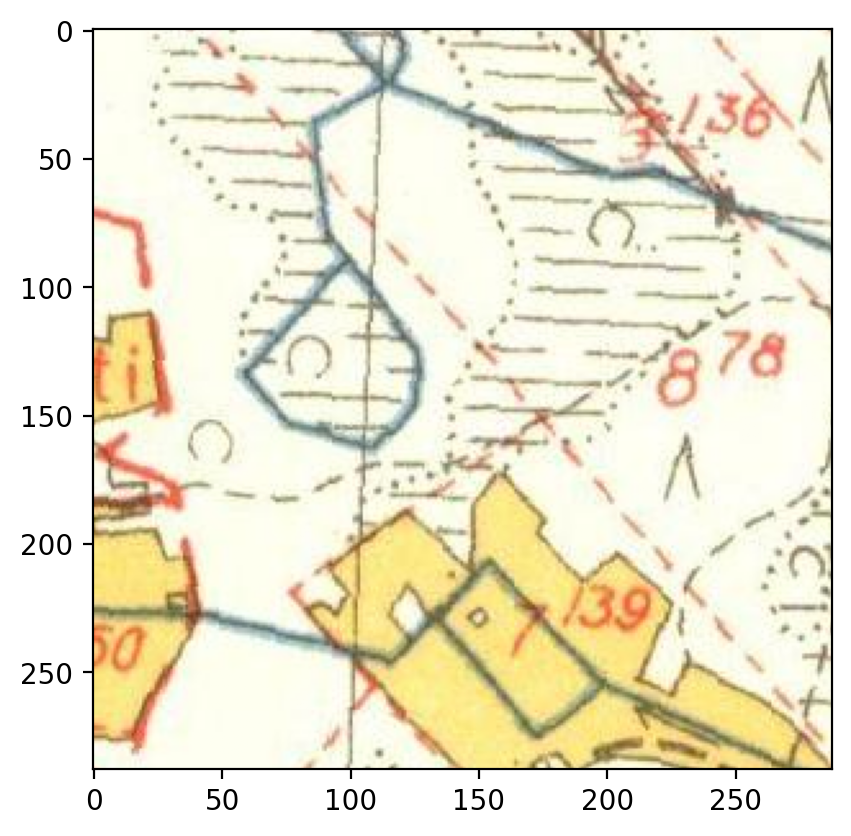

(1077, 288, 288, 1)
uint8


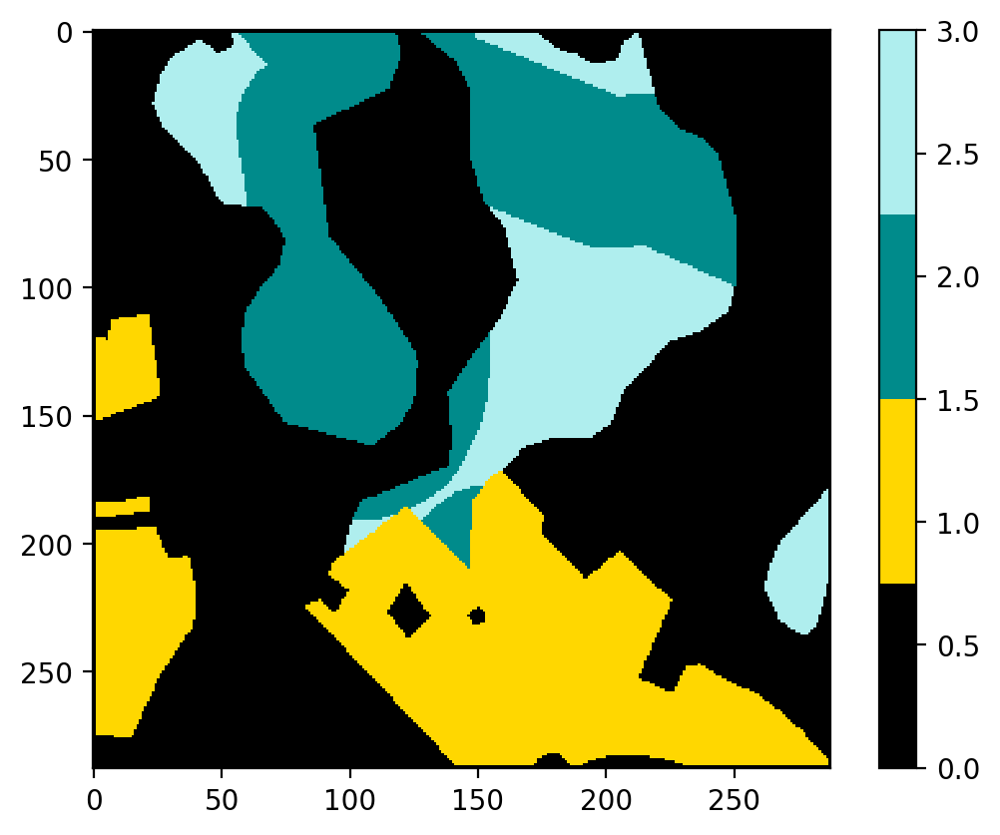

(359, 288, 288, 3)
float32


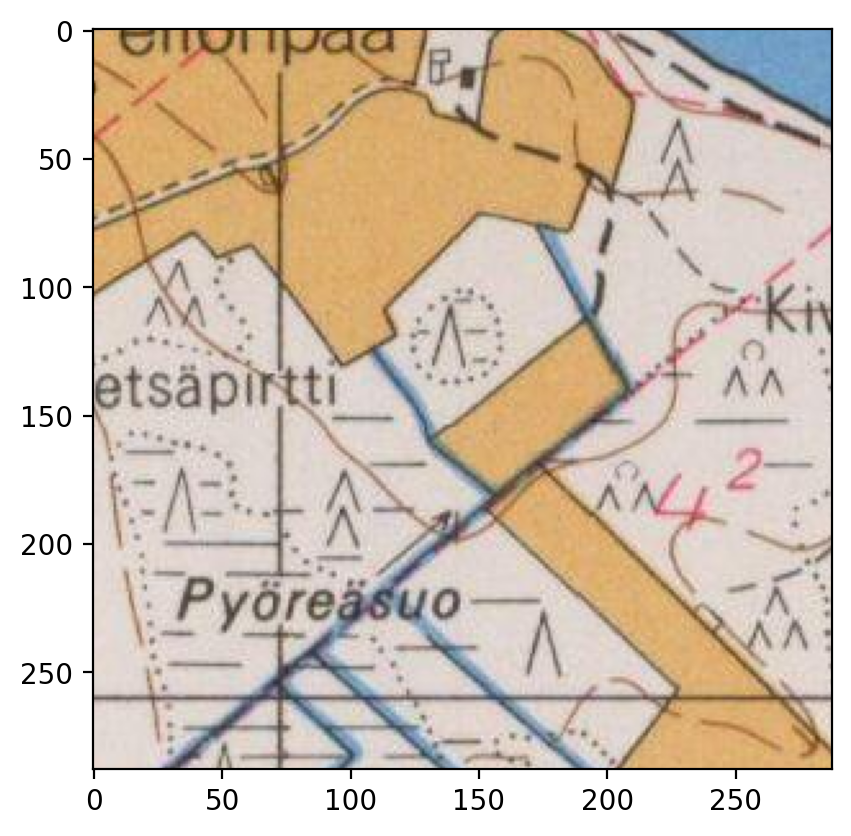

(359, 288, 288, 1)
uint8


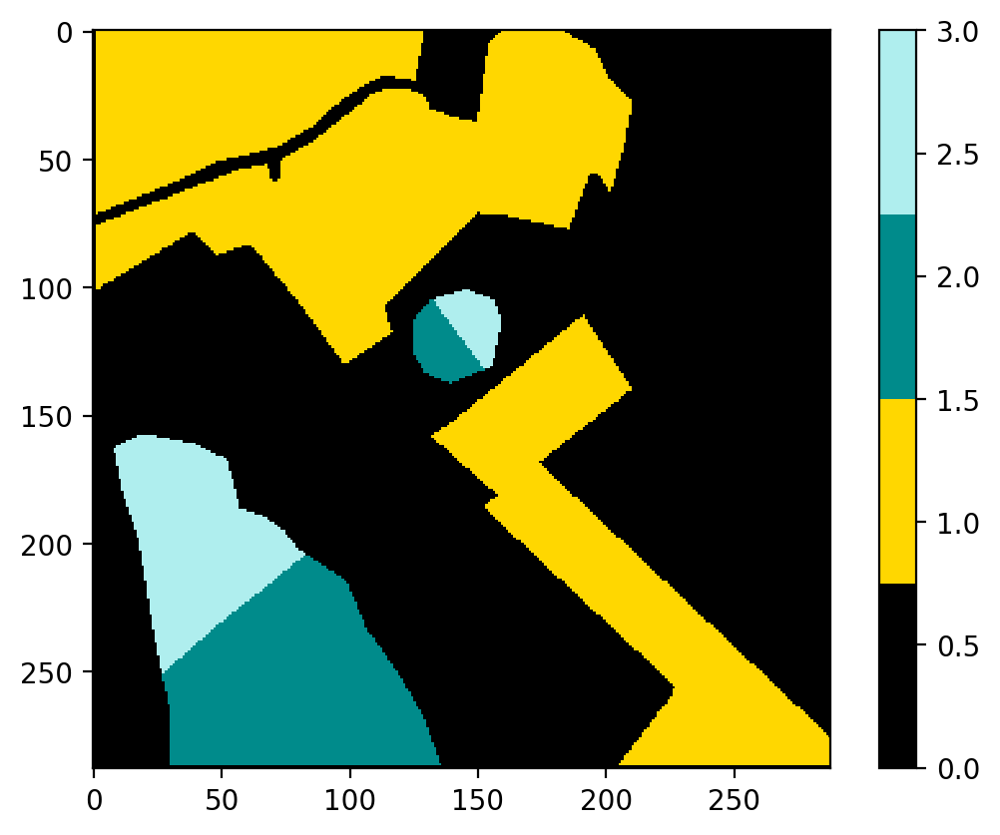

(1077, 288, 288, 4)
float32


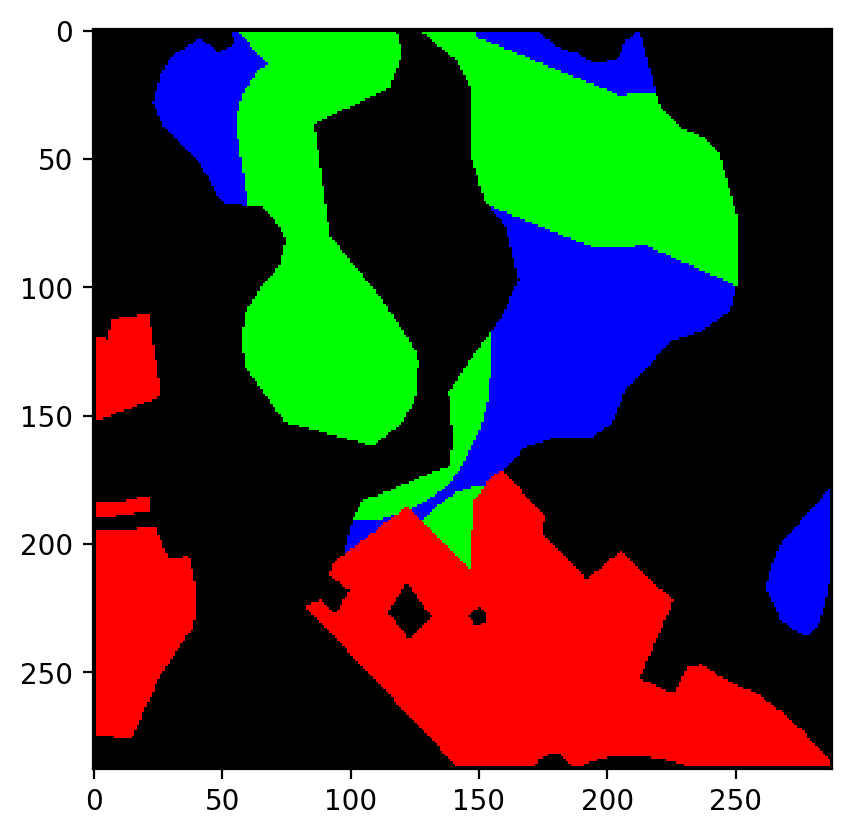

(359, 288, 288, 4)
float32


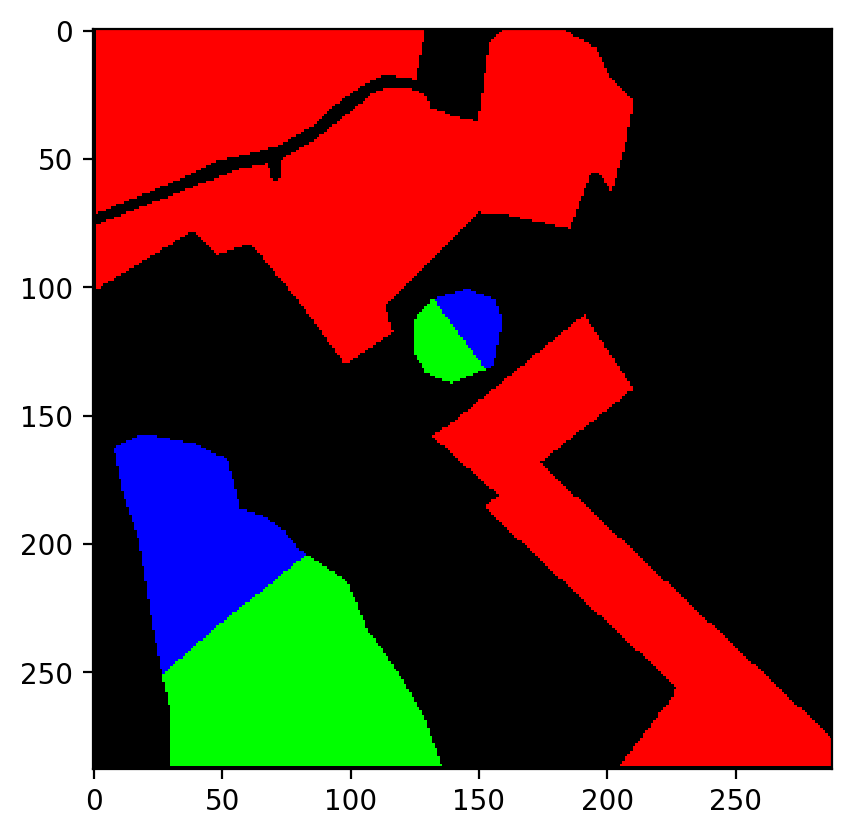

In [5]:
train_img_example = 1013
print(train_data.shape)
print(train_data.dtype)
plt.imshow(train_data[train_img_example])
plt.show()

print(train_label_arr.shape)
print(train_label_arr.dtype)
label_cmap=ListedColormap(['black', 'gold', 'darkcyan', 'paleturquoise'])
plt.imshow(train_label_arr[train_img_example], vmin=0, vmax=3, cmap=label_cmap, interpolation='none')
plt.colorbar()
plt.show()

test_img_example = 65
print(test_data.shape)
print(test_data.dtype)
plt.imshow(test_data[test_img_example])
plt.show()

print(test_label_arr.shape)
print(test_label_arr.dtype)
label_cmap=ListedColormap(['black', 'gold', 'darkcyan', 'paleturquoise'])
plt.imshow(test_label_arr[test_img_example], vmin=0, vmax=3, cmap=label_cmap, interpolation='none')
plt.colorbar()
plt.show()

train_labels = image_label_to_categorical(train_label_arr, class_count=3, drop_background=False)
test_labels = image_label_to_categorical(test_label_arr, class_count=3, drop_background=False)
print(train_labels.shape)
print(train_labels.dtype)
plt.imshow(train_labels[train_img_example, :, :, 1:4], interpolation='none', vmin=0, vmax=1)
plt.show()

print(test_labels.shape)
print(test_labels.dtype)
plt.imshow(test_labels[test_img_example, :, :, 1:4], interpolation='none', vmin=0, vmax=1)
plt.show()

In [8]:
# Ensures that images are processed correctly

# Training is stopped if validation loss hasn't improved in some epochs
callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=40)

batch_size = 32
epoch_count = 1000

model = None

# Unet with data augmentation
#model = build_autoencoder_multichannel_skip(img_width, band_count)
#model = get_model(img_size=(img_width, img_width), num_classes=4)
model = create_sidiwu_models(shape=img_width) 
model.summary()

model.compile(
    optimizer=Adam(),
    loss=multiclass_weighted_cross_entropy([1.0, 7.2, 11.3, 7.1]))

history = model.fit(train_data, train_labels, batch_size=batch_size, epochs=epoch_count, validation_split=0.25, callbacks=[callback])

Model: "classifier"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 class_input (InputLayer)       [(None, 288, 288, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_25 (Conv2D)             (None, 288, 288, 16  448         ['class_input[0][0]']            
                                )                                                                 
                                                                                                  
 batch_normalization_27 (BatchN  (None, 288, 288, 16  64         ['conv2d_25[0][0]']              
 ormalization)                  )                                                        

In [ ]:
#model_path = "/tf/Koulutyöt/Gradu/data/malli/"
#model.save(model_path)

In [9]:
model.evaluate(test_data, test_labels)
prediction = model.predict(test_data)
train_prediction = model.predict(train_data)

34/34 [==============================] - 2s 60ms/step


In [ ]:
loaded_model = None
# Training is stopped if validation loss hasn't improved in some epochs
callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=100)

batch_size = 32
epoch_count = 1000

model_path = "/tf/Koulutyöt/Gradu/data/malli"
loaded_model = create_sidiwu_models(shape=img_width)
loaded_model.compile(
    optimizer=Adam(),
    loss=multiclass_weighted_cross_entropy([1.0, 7.2, 11.3, 7.1]))
checkpoint = loaded_model.load_weights(model_path)

history = loaded_model.fit(train_data, train_labels, batch_size=batch_size, epochs=epoch_count, validation_split=0.25, callbacks=[callback])

Epoch 1/1000
26/26 [==============================] - 17s 387ms/step - loss: 1.7923 - val_loss: 8.9361
Epoch 2/1000
26/26 [==============================] - 9s 343ms/step - loss: 1.0642 - val_loss: 8.9362
Epoch 3/1000
26/26 [==============================] - 9s 332ms/step - loss: 1.0087 - val_loss: 7.6980
Epoch 4/1000
26/26 [==============================] - 9s 328ms/step - loss: 0.9814 - val_loss: 4.0835
Epoch 5/1000
26/26 [==============================] - 9s 329ms/step - loss: 0.9575 - val_loss: 0.9711
Epoch 6/1000
26/26 [==============================] - 9s 331ms/step - loss: 0.9514 - val_loss: 0.8696
Epoch 7/1000
26/26 [==============================] - 9s 339ms/step - loss: 0.9474 - val_loss: 0.8064
Epoch 8/1000
26/26 [==============================] - 9s 337ms/step - loss: 0.9630 - val_loss: 2.1632
Epoch 9/1000
26/26 [==============================] - 9s 327ms/step - loss: 0.9471 - val_loss: 0.8895
Epoch 10/1000
26/26 [==============================] - 9s 330ms/step - loss: 1.00

In [10]:
model_path = "/tf/Koulutyöt/Gradu/data/malli"
loaded_model = create_sidiwu_models(shape=img_width)
loaded_model.compile(
    optimizer=Adam(),
    loss=multiclass_weighted_cross_entropy([1.0, 7.3, 11.5, 7.2]))
checkpoint = loaded_model.load_weights(model_path)

In [11]:
loaded_model.evaluate(test_data, test_labels)
prediction = loaded_model.predict(test_data)
train_prediction = loaded_model.predict(train_data)

34/34 [==============================] - 2s 45ms/step


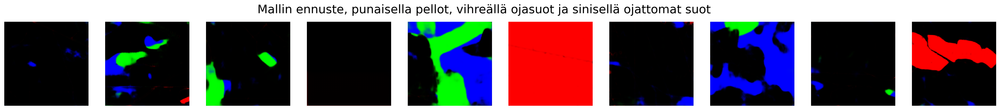

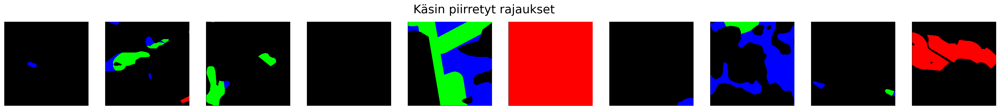

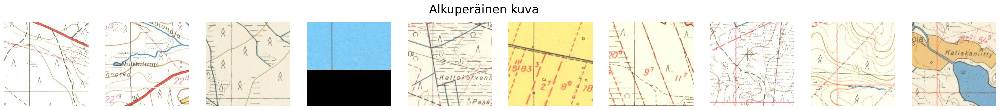

In [12]:
pltsize = 3
test_count = 359

index = random.randint(10, test_count)
#index=79
# Predictions
plt.figure(figsize=(10*pltsize, 3 * pltsize))
for j, i in enumerate(range(index - 10, index)):
    plt.subplot(1,10,j+1)
    plt.axis('off')
    plt.suptitle('Mallin ennuste, punaisella pellot, vihreällä ojasuot ja sinisellä ojattomat suot', y=0.65, size=20)
    plt.imshow(prediction[i,:,:,1:4], vmin=0, vmax=1, interpolation='none')
    #plt.set_cmap('cividis')
    #plt.colorbar(fraction=0.010)
plt.show()
"""
# Uncertainty
plt.figure(figsize=(10*pltsize, 3 * pltsize))
for j, i in enumerate(range(index - 10, index)):
    plt.subplot(1,10,j+1)
    plt.axis('off')
    plt.suptitle('Certainty estimate (bright = low certainty)', y=0.65, size=20)
    plt.imshow(prediction[i,:,:,5:8], vmin=0, vmax=1)
    plt.set_cmap('magma_r')
    #plt.colorbar(fraction=0.010)
plt.show()
"""

# Ground truth
plt.figure(figsize=(10*pltsize, 3 * pltsize))
for j, i in enumerate(range(index - 10, index)):
    plt.subplot(1,10,j+1)
    plt.axis('off')
    plt.suptitle('Käsin piirretyt rajaukset' , y=0.65, size=20)
    plt.imshow(test_labels[i,:,:,1:4], vmin=0, vmax=1)
    #plt.set_cmap('cividis')
plt.show()
plt.figure(figsize=(10*pltsize, 3 * pltsize))
for j, i in enumerate(range(index - 10, index)):
    plt.subplot(1,10,j+1)
    plt.axis('off')
    plt.suptitle('Alkuperäinen kuva', y=0.65, size=20)
    plt.imshow(test_data[i])
    #plt.set_cmap('viridis')
plt.show()

# IoU

In [13]:
# Getting the classes separately to calculate class based metrics
field_predictions = prediction[:, :, :, 1].round().astype('uint8')
field_labels = test_labels[:, :, :, 1].round().astype('uint8')

ditch_swamp_predictions = prediction[:, :, :, 2].round().astype('uint8')
ditch_swamp_labels = test_labels[:, :, :, 2].round().astype('uint8')

non_ditch_swamp_predictions = prediction[:, :, :, 3].round().astype('uint8')
non_ditch_swamp_labels = test_labels[:, :, :, 3].round().astype('uint8')

fields_total_IoU = image_IoU(field_predictions, field_labels)
ditch_swamp_total_IoU = image_IoU(ditch_swamp_predictions, ditch_swamp_labels)
non_ditch_swamp_total_IoU = image_IoU(non_ditch_swamp_predictions, non_ditch_swamp_labels)

field_IoUs = np.empty(test_count, dtype='float32')
ditch_swamp_IoUs = np.empty(test_count, dtype='float32')
non_ditch_swamp_IoUs = np.empty(test_count, dtype='float32')
for i in range (test_count):
    field_IoUs[i] = (image_IoU(field_predictions[i], field_labels[i]))
    ditch_swamp_IoUs[i] = (image_IoU(ditch_swamp_predictions[i], ditch_swamp_labels[i]))
    non_ditch_swamp_IoUs[i] = (image_IoU(non_ditch_swamp_predictions[i], non_ditch_swamp_labels[i]))

Fields median IoU:0.9110284447669983
Ojasuot median IoU:0.6943756341934204
Ojattomat median IoU:0.5781607031822205


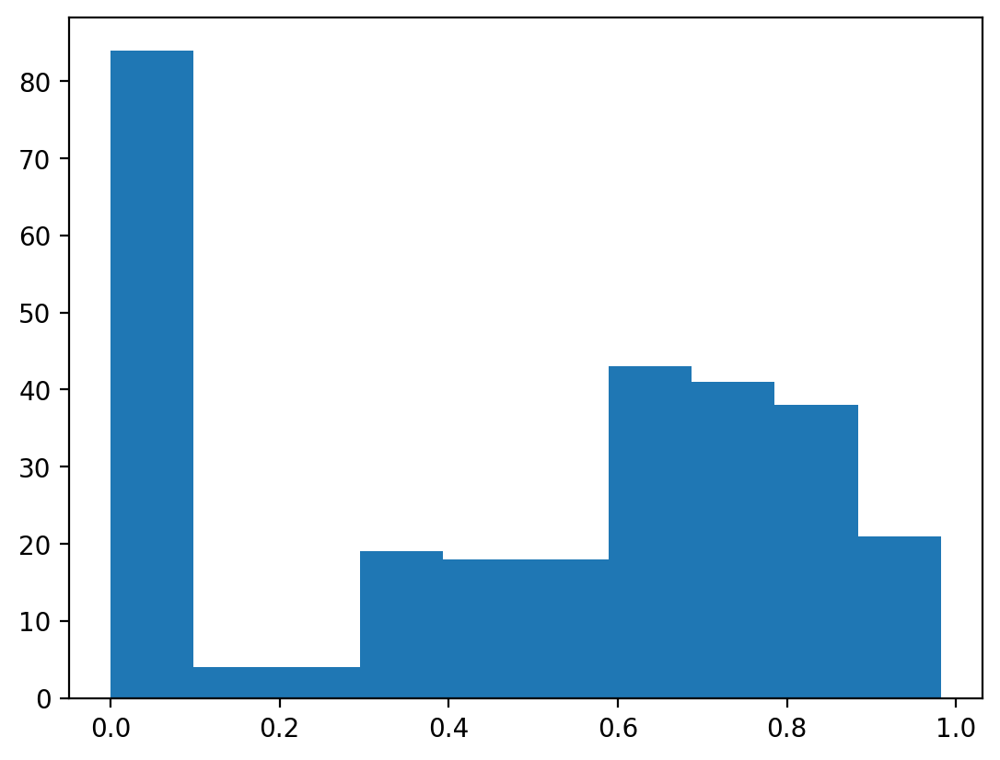

In [14]:
print(f"Fields median IoU:{np.nanmedian(field_IoUs)}")
print(f"Ojasuot median IoU:{np.nanmedian(ditch_swamp_IoUs)}")
print(f"Ojattomat median IoU:{np.nanmedian(non_ditch_swamp_IoUs)}")
plt.hist(non_ditch_swamp_IoUs, bins='auto')
plt.show()

# Confusion matrix

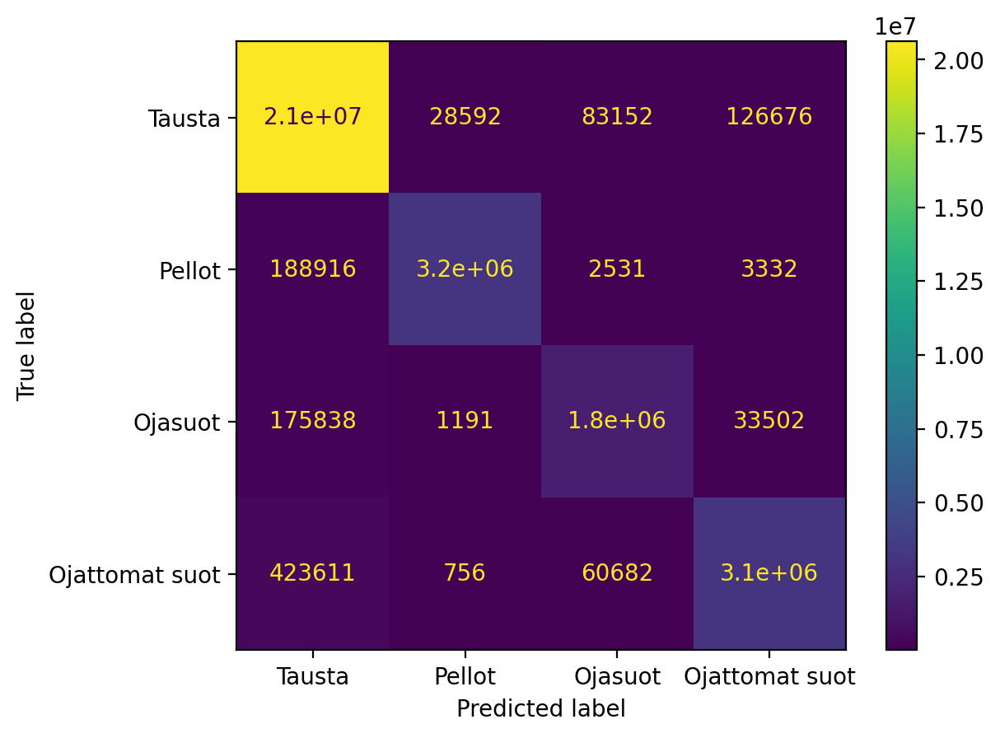

In [73]:
# Values are floats between 0 and 1, this sets them to 0 or 1
prediction_classes = np.argmax(prediction, axis=-1).astype('uint8')
prediction_confusion_matrix = confusion_matrix(prediction_classes.flatten(), test_label_arr.flatten()
disp = ConfusionMatrixDisplay(prediction_confusion_matrix, display_labels=["Tausta", "Pellot", "Ojasuot", "Ojattomat suot"])
disp.plot()
plt.show()
                                               

In [74]:
print(prediction_confusion_matrix)

[[20619360    28592    83152   126676]
 [  188916  3154127     2531     3332]
 [  175838     1191  1757300    33502]
 [  423611      756    60682  3117330]]


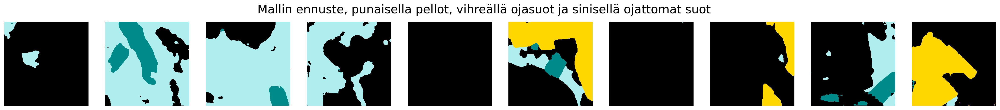

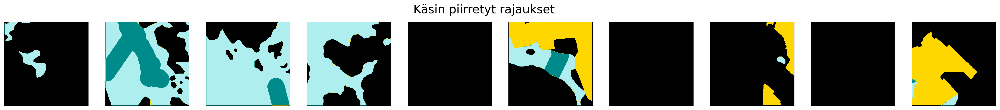

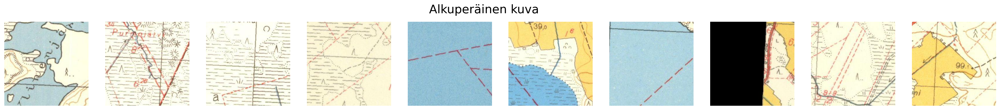

In [57]:
pltsize = 3
test_count = 359
#index = random.randint(10, test_count)
index=350
# Predictions
plt.figure(figsize=(10*pltsize, 3 * pltsize))
for j, i in enumerate(range(index - 10, index)):
    plt.subplot(1,10,j+1)
    plt.axis('off')
    plt.suptitle('Mallin ennuste, punaisella pellot, vihreällä ojasuot ja sinisellä ojattomat suot', y=0.65, size=20)
    plt.imshow(prediction_classes[i], cmap=label_cmap, interpolation='none', vmin=0, vmax=3)
    #plt.set_cmap('cividis')
    #plt.colorbar(fraction=0.010)
plt.show()

"""
# Uncertainty
plt.figure(figsize=(10*pltsize, 3 * pltsize))
for j, i in enumerate(range(index - 10, index)):
    plt.subplot(1,10,j+1)
    plt.axis('off')
    plt.suptitle('Certainty estimate (bright = low certainty)', y=0.65, size=20)
    plt.imshow(prediction[i,:,:,5:8], vmin=0, vmax=1)
    plt.set_cmap('magma_r')
    #plt.colorbar(fraction=0.010)
plt.show()
"""

# Ground truth
plt.figure(figsize=(10*pltsize, 3 * pltsize))
for j, i in enumerate(range(index - 10, index)):
    plt.subplot(1,10,j+1)
    plt.axis('off')
    plt.suptitle('Käsin piirretyt rajaukset' , y=0.65, size=20)
    plt.imshow(test_label_arr[i], cmap=label_cmap, vmin=0, vmax=3)
    #plt.set_cmap('cividis')
plt.show()
plt.figure(figsize=(10*pltsize, 3 * pltsize))
for j, i in enumerate(range(index - 10, index)):
    plt.subplot(1,10,j+1)
    plt.axis('off')
    plt.suptitle('Alkuperäinen kuva', y=0.65, size=20)
    plt.imshow(test_data[i])
    #plt.set_cmap('viridis')
plt.show()

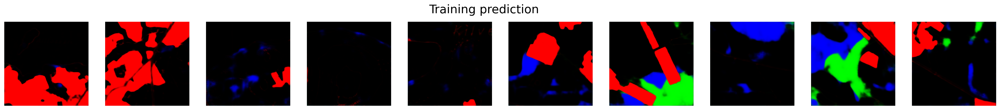

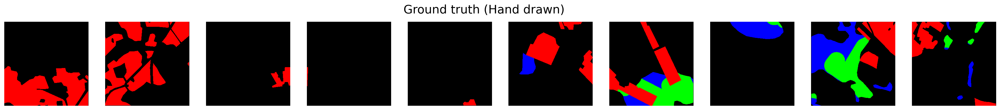

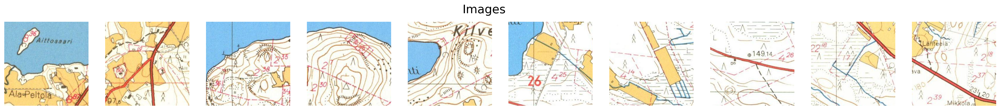

In [65]:
pltsize = 3
train_count = 849
index = random.randint(10, train_count)

# Predictions
plt.figure(figsize=(10*pltsize, 3 * pltsize))
for j, i in enumerate(range(index - 10, index)):
    plt.subplot(1,10,j+1)
    plt.axis('off')
    plt.suptitle('Training prediction', y=0.65, size=20)
    plt.imshow(train_prediction[i,:,:,1:4], vmin=0, vmax=1)
    #plt.set_cmap('cividis')
    #plt.colorbar(fraction=0.010)
plt.show()
"""
# Uncertainty
plt.figure(figsize=(10*pltsize, 3 * pltsize))
for j, i in enumerate(range(index - 10, index)):
    plt.subplot(1,10,j+1)
    plt.axis('off')
    plt.suptitle('Certainty estimate (bright = low certainty)', y=0.65, size=20)
    plt.imshow(prediction[i,:,:,5:8], vmin=0, vmax=1)
    plt.set_cmap('magma_r')
    #plt.colorbar(fraction=0.010)
plt.show()
"""

# Ground truth
plt.figure(figsize=(10*pltsize, 3 * pltsize))
for j, i in enumerate(range(index - 10, index)):
    plt.subplot(1,10,j+1)
    plt.axis('off')
    plt.suptitle('Ground truth (Hand drawn)', y=0.65, size=20)
    plt.imshow(train_labels[i,:,:,1:4], vmin=0, vmax=1)
    #plt.set_cmap('cividis')
plt.show()
plt.figure(figsize=(10*pltsize, 3 * pltsize))
for j, i in enumerate(range(index - 10, index)):
    plt.subplot(1,10,j+1)
    plt.axis('off')
    plt.suptitle('Images', y=0.65, size=20)
    plt.imshow(train_data[i])
    #plt.set_cmap('viridis')
plt.show()

In [ ]:
pltsize = 3
train_count = 32
#index = random.randint(10, train_count)
index = 10
# Predictions
plt.figure(figsize=(10*pltsize, 3 * pltsize))
for j, i in enumerate(range(index - 10, index)):
    plt.subplot(1,10,j+1)
    plt.axis('off')
    plt.suptitle('Prediction', y=0.65, size=20)
    plt.imshow(overfitting_prediction[i,:,:,1:4], vmin=0, vmax=1)
    #plt.set_cmap('cividis')
    #plt.colorbar(fraction=0.010)
plt.show()
"""
# Uncertainty
plt.figure(figsize=(10*pltsize, 3 * pltsize))
for j, i in enumerate(range(index - 10, index)):
    plt.subplot(1,10,j+1)
    plt.axis('off')
    plt.suptitle('Certainty estimate (bright = low certainty)', y=0.65, size=20)
    plt.imshow(prediction[i,:,:,5:8], vmin=0, vmax=1)
    plt.set_cmap('magma_r')
    #plt.colorbar(fraction=0.010)
plt.show()
"""

# Ground truth
plt.figure(figsize=(10*pltsize, 3 * pltsize))
for j, i in enumerate(range(index - 10, index)):
    plt.subplot(1,10,j+1)
    plt.axis('off')
    plt.suptitle('Ground truth (locations of occurences, mainly iron)', y=0.65, size=20)
    plt.imshow(overfitting_labels[i,:,:,1:4], vmin=0, vmax=1)
    #plt.set_cmap('cividis')
plt.show()
plt.figure(figsize=(10*pltsize, 3 * pltsize))
for j, i in enumerate(range(index - 10, index)):
    plt.subplot(1,10,j+1)
    plt.axis('off')
    plt.suptitle('Image', y=0.65, size=20)
    plt.imshow(overfitting_train_data[i])
    #plt.set_cmap('viridis')
plt.show()

In [ ]:
augmentation_model = None
augmentation_model = image_augmentation_test()
augmentation_model.summary()
augmentation_results = augmentation_model.predict(test_data)

In [ ]:
pltsize = 3
test_count = 359
index = random.randint(10, test_count)
#index=31
# Predictions
plt.figure(figsize=(10*pltsize, 3 * pltsize))
for j, i in enumerate(range(index - 10, index)):
    plt.subplot(1,10,j+1)
    plt.axis('off')
    plt.suptitle('Prediction', y=0.65, size=20)
    plt.imshow(augmentation_results[i], vmin=0, vmax=1)
    #plt.set_cmap('cividis')
    #plt.colorbar(fraction=0.010)
plt.show()

"""
# Uncertainty
plt.figure(figsize=(10*pltsize, 3 * pltsize))
for j, i in enumerate(range(index - 10, index)):
    plt.subplot(1,10,j+1)
    plt.axis('off')
    plt.suptitle('Certainty estimate (bright = low certainty)', y=0.65, size=20)
    plt.imshow(prediction[i,:,:,5:8], vmin=0, vmax=1)
    plt.set_cmap('magma_r')
    #plt.colorbar(fraction=0.010)
plt.show()
"""

# Ground truth
plt.figure(figsize=(10*pltsize, 3 * pltsize))
for j, i in enumerate(range(index - 10, index)):
    plt.subplot(1,10,j+1)
    plt.axis('off')
    plt.suptitle('Ground truth Red:fields, Blue_swamps', y=0.65, size=20)
    plt.imshow(test_labels[i,:,:,1:4], vmin=0, vmax=1)
    #plt.set_cmap('cividis')
plt.show()
plt.figure(figsize=(10*pltsize, 3 * pltsize))
for j, i in enumerate(range(index - 10, index)):
    plt.subplot(1,10,j+1)
    plt.axis('off')
    plt.suptitle('Aeromagnetic anomaly ', y=0.65, size=20)
    plt.imshow(test_data[i])
    #plt.set_cmap('viridis')
plt.show()

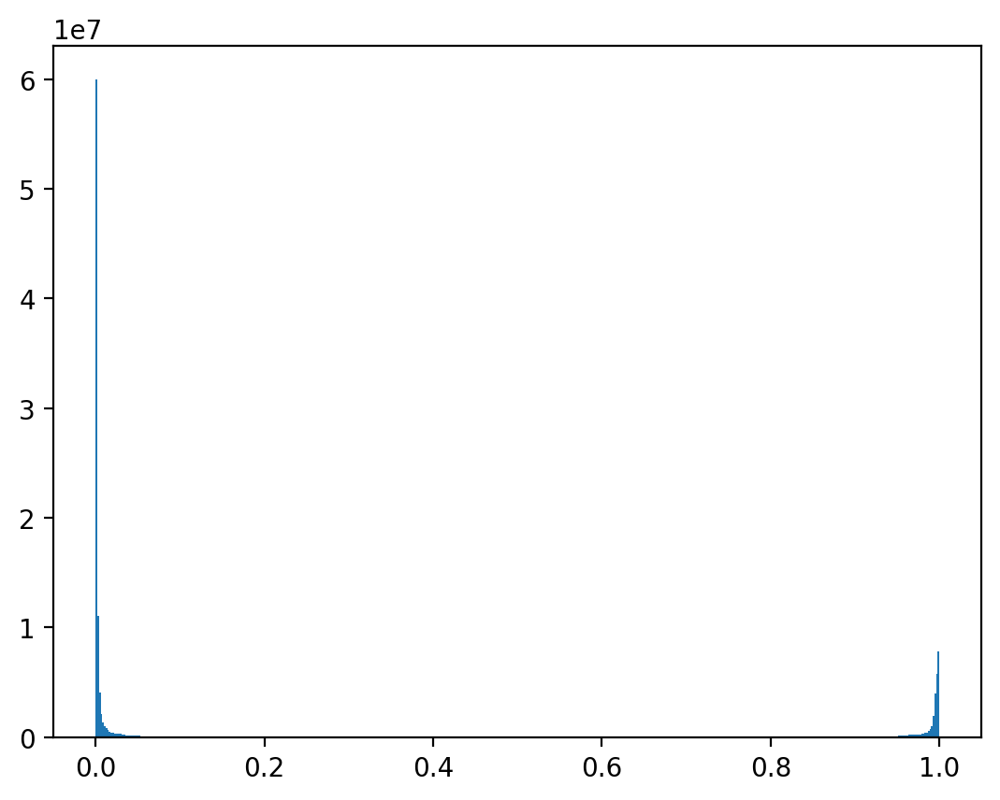

In [30]:
#histogram = np.histogram(prediction, range=(0.0, 1.0))
plt.hist(prediction.flatten(), bins='auto')
plt.show()

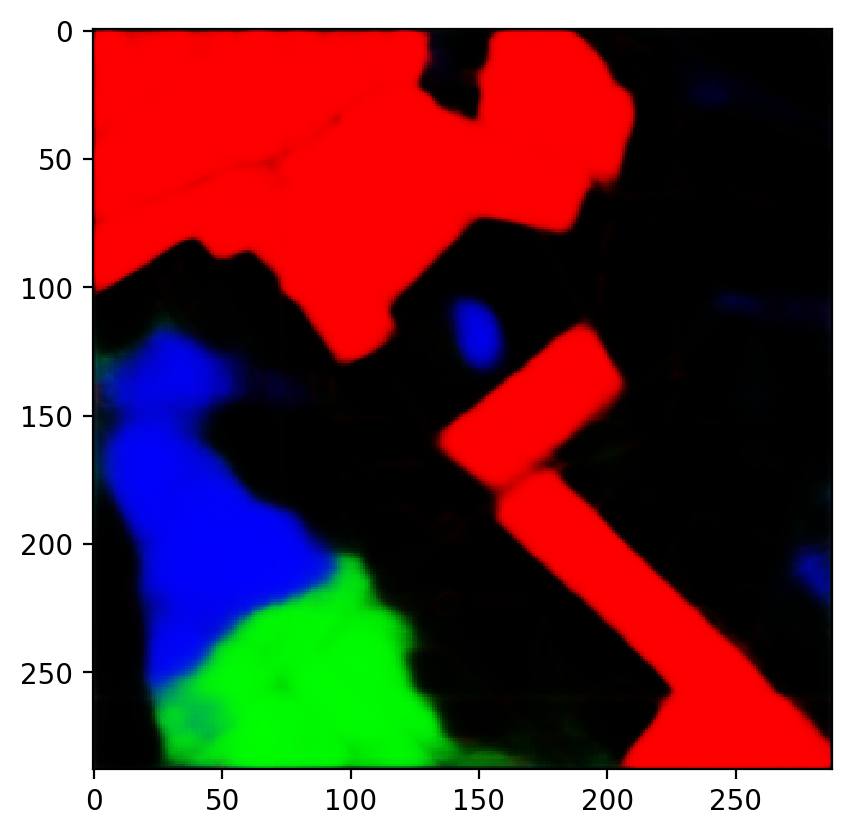

In [52]:
test_img_example= 
plt.imshow(prediction[test_img_example, :, :, 1:4], interpolation='none', vmin=0, vmax=1)
plt.show()

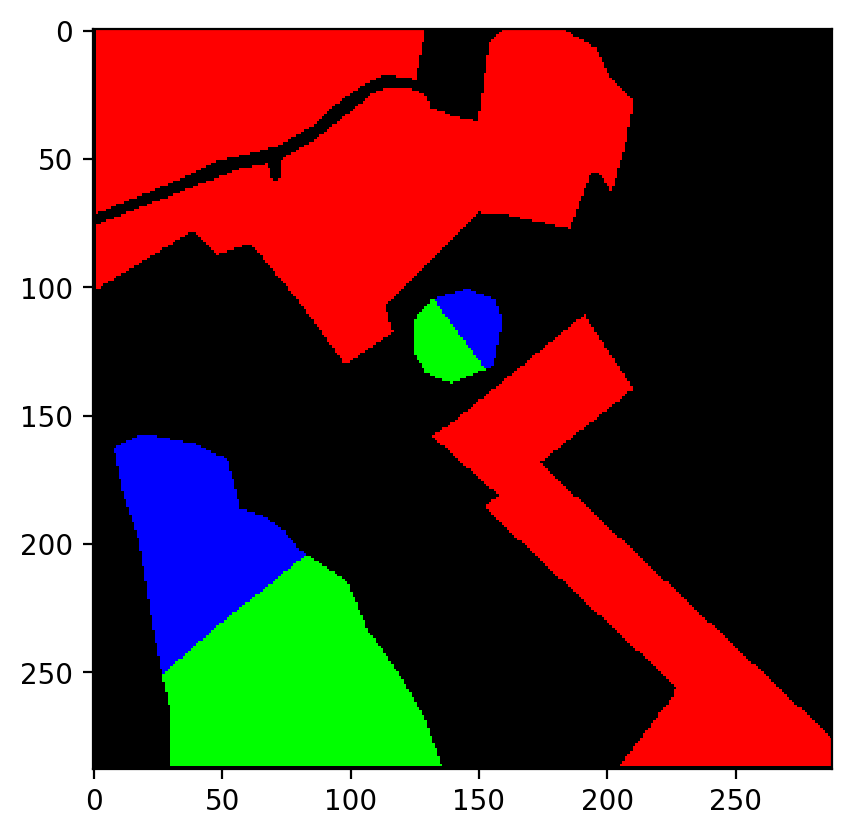

In [53]:
plt.imshow(test_labels[test_img_example, :, :, 1:4], interpolation='none', vmin=0, vmax=1)
plt.show()

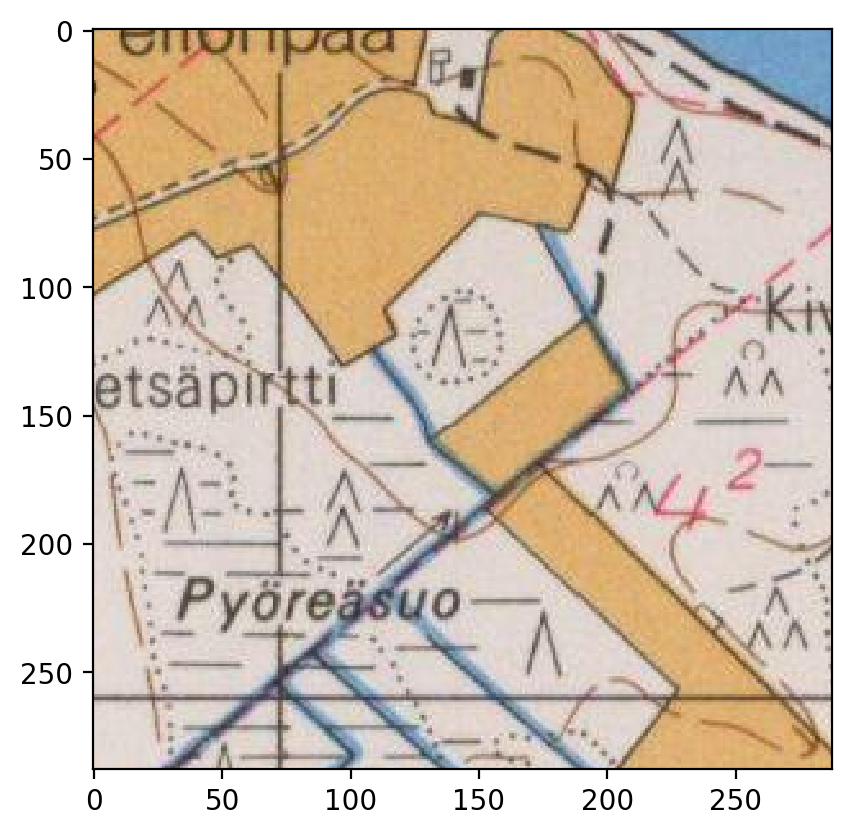

In [54]:
plt.imshow(test_data[test_img_example], interpolation='none')
plt.show()

In [5]:
print(keras.__version__)

2.11.0


In [7]:
overfitting_train_data = np.empty((32, 288, 288, 3), dtype='float32')
overfitting_labels = np.empty((32, 288, 288, 4), dtype='float32')
for i in range(32):
    overfitting_train_data[i] = train_data[train_img_example]

for i in range(32):
    overfitting_labels[i] = train_labels[train_img_example]